In [1]:
import pandas as pd
import sys
from tensorflow import keras
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import cv2
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
sys.path.append("../../")
from src.transfer_learning.transfer_AlexNet_model import create_transfer_model_AlexNet
from src.prediction.predict_labels import jpgs_to_array
from src.validation.train_val_test_split import get_data_files_df

In [3]:
feature_selector = create_transfer_model_AlexNet(
    "/data/dssg/occrp/data/weights/featureSelection/AlexNet_2022_07_06-18_12_50/weights/epoch7", 3
)

2022-07-11 17:51:43.219334: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-11 17:51:43.221536: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-11 17:51:43.232116: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/cordero/.local/share/virtualenvs/dssgxdfki2022-occrp-kILcxiHt/lib64/python3.8/site-packages/cv2/../../lib64:
2022-07-11 17:51:43.232143: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you w

In [4]:
feature_selector_cutted = keras.Sequential(feature_selector.layers[:-2])

In [5]:
files_df = get_data_files_df("/data/dssg/occrp/data/processed")
files_df["page_num"] = files_df["path"].str.extract(r".*(\d+)\.jpg$")
files_sample_df = files_df[files_df["page_num"] == "1"].groupby("db").head(1000).reset_index(drop=True)
files_sample_df = files_sample_df.reset_index()

In [6]:
images_arrays = jpgs_to_array(files_sample_df["path"].to_list())
feature_extraction_sample = feature_selector_cutted.predict(images_arrays)

337/337 [==============================] - 43s 128ms/step


In [7]:
def plot_image(df, i):
    img = cv2.imread(df["path"].iloc[i])
    plt.imshow(img)
    plt.title(f"{i}")
    plt.show()

## PCA

In [8]:
pca = PCA(n_components=4)
files_sample_df[[f"pca_{i}" for i in range(1, 5)]] = pd.DataFrame(pca.fit_transform(feature_extraction_sample))

In [9]:
pca.explained_variance_ratio_

array([0.17703107, 0.10510612, 0.08257519, 0.0732093 ], dtype=float32)

In [10]:
pca.explained_variance_ratio_.sum()

0.43792164

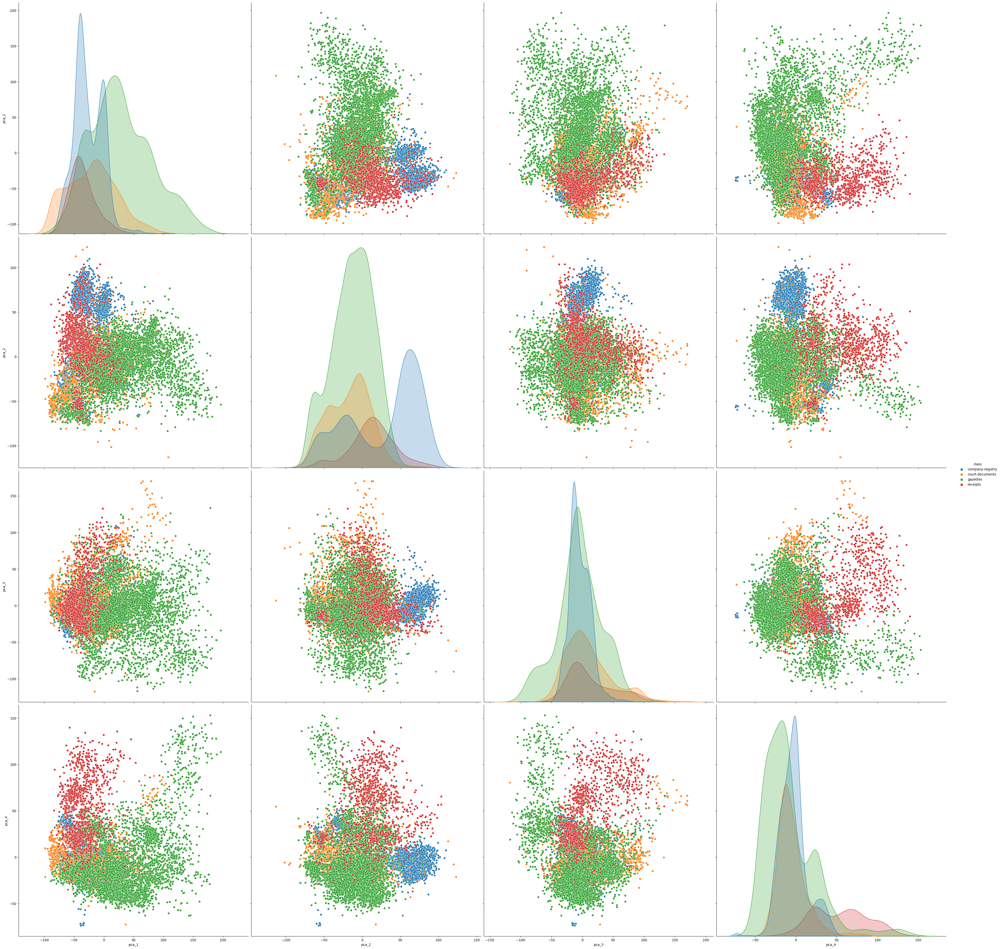

In [14]:
sns.pairplot(files_sample_df[[f"pca_{i}" for i in range(1, 5)] + ["class"]], hue="class", height=10)

In [15]:
px.scatter(files_sample_df, "pca_1", "pca_2", color="class", hover_data=["index"], width=1000, height=700)

In [16]:
px.scatter(files_sample_df, "pca_1", "pca_2", color="db")

## TSNE

In [17]:
tsne = TSNE(n_components=2, init="pca", learning_rate="auto")
files_sample_df[[f"tsne_{i}" for i in range(1, 3)]] = pd.DataFrame(tsne.fit_transform(feature_extraction_sample))

/home/cordero/.local/share/virtualenvs/dssgxdfki2022-occrp-kILcxiHt/lib64/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [18]:
px.scatter(files_sample_df, "tsne_1", "tsne_2", color="class")

In [19]:
px.scatter(files_sample_df, "tsne_1", "tsne_2", color="db")

## Random Sample of Aleph